In [8]:
import os
import io

import cv2 as cv
import numpy as np

from matplotlib import pyplot as plt
from PIL import Image as pil_image

# Utilities

In [9]:
def imgs_show(imgs, rows, fontsize=36):
    fig = plt.figure()
    for n, (img, title) in enumerate(imgs):
        a = fig.add_subplot(rows, np.ceil(len(imgs)/float(rows)), n + 1)
        a.set_title(title, fontdict={"fontsize": fontsize})
        plt.imshow(img)
    fig.set_size_inches(np.array(fig.get_size_inches()) * len(imgs))
    plt.show()

def read_folder(folder, ext):
    images = []
    for filename in sorted(os.listdir(folder)):
        if filename.endswith(ext):
            path = os.path.join(folder, filename)
            images.append(np.array(pil_image.open(path)))
    return images

def img_show(img, title = '', figsize=(10, 5)):
    plt.figure(figsize=figsize)
    plt.gray()
    plt.imshow(img)
    plt.title(title)
    plt.show()

# Images

In [10]:
chassboard = read_folder('./cv_dataset/', '.jpg')

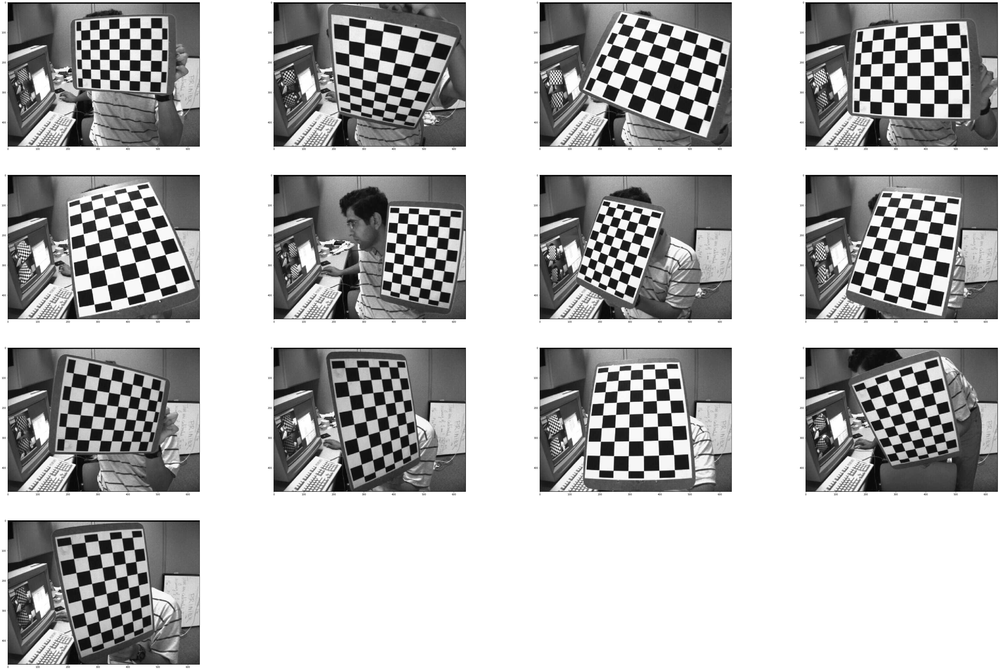

In [11]:
imgs_show([(cv.cvtColor(img,cv.COLOR_BGR2RGB), "") for img in chassboard], 4)

# Calibration

### [OpenCV tutorial](https://opencv-python-tutroals.readthedocs.io/en/latest/py_tutorials/py_calib3d/py_calibration/py_calibration.html)

Today’s cheap pinhole cameras introduces a lot of distortion to images. Two major distortions are:
- **Radial distortion** - straight lines will appear curved. Its effect is more as we move away from the center of image.
- **Tangential distortion** - occurs because image taking lense is not aligned perfectly parallel to the imaging plane. So some areas in image may look nearer than expected.

In [17]:
class CameraCalibration:
    # termination criteria
    CRITERIA = (cv.TERM_CRITERIA_EPS + cv.TERM_CRITERIA_MAX_ITER, 30, 0.001)
    
    def __init__(self, size):
        self.size = size
        # prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
        self.objp = np.zeros((size[0]*size[1],3), np.float32)
        self.objp[:,:2] = np.mgrid[0:size[0],0:size[1]].T.reshape(-1,2)

        # Arrays to store object points and image points from all the images.
        self.objpoints = [] # 3d point in real world space
        self.imgpoints = [] # 2d points in image plane.
        
        self.img_size = None
        self.mtx = None
        self.dist = None
        
    def fit(self, imgs, draw=True, rows=2):
        with_corners = []
        
        self.img_size = imgs[0].shape[:2]
        
        for gray in imgs:
            if len(gray.shape) == 3:
                gray = cv.cvtColor(gray, cv.COLOR_RGB2GRAY)

            # Find the chess board corners
            ret, corners = cv.findChessboardCorners(gray, self.size, None)
            if not ret:
                continue
            
            # If found, add object points, image points (after refining them)
            self.objpoints.append(self.objp)
            corners2 = cv.cornerSubPix(gray, corners, (11, 11), (-1, -1), CameraCalibration.CRITERIA)
            self.imgpoints.append(corners2)
            
            if draw:
                with_corners.append(cv.drawChessboardCorners(cv.cvtColor(gray, cv.COLOR_GRAY2RGB), self.size, corners2, ret))
        
        if draw:
            imgs_show([(img, "") for img in with_corners], rows)
            
    def calibrate(self):
        ret, self.mtx, self.dist, rvecs, tvecs = cv.calibrateCamera(
            self.objpoints, 
            self.imgpoints, 
            self.img_size, 
            None, 
            None,
        )
        
        tot_error = 0
        for i in range(len(self.objpoints)):
            imgpoints2, _ = cv.projectPoints(self.objpoints[i], rvecs[i], tvecs[i], self.mtx, self.dist)
            error = cv.norm(self.imgpoints[i], imgpoints2, cv.NORM_L2)/len(imgpoints2)
            tot_error += error

        return tot_error / len(self.objpoints)
        
    def undistort(self, img):
        h, w = img.shape[:2]
        newcameramtx, roi=cv.getOptimalNewCameraMatrix(self.mtx, self.dist, (w, h), 1, (w, h))
        # undistort
        mapx, mapy = cv.initUndistortRectifyMap(self.mtx, self.dist, None, newcameramtx, (w, h), 5)
        dst = cv.remap(img, mapx, mapy, cv.BORDER_CONSTANT)
        
        # crop the image
        x, y, w, h = roi
        return dst[y:y+h, x:x+w]
    
    @staticmethod
    def run(size, imgs, rows=2):
        cc = CameraCalibration(size)
        cc.fit(imgs, rows=rows)
        mean_error = cc.calibrate()
        print("Calibration total error: {}".format(mean_error))
        result = []
        for i, img in enumerate(imgs):
            undistorted = cc.undistort(img)
            result.append(undistorted)
        return result

# Open CV dataset test

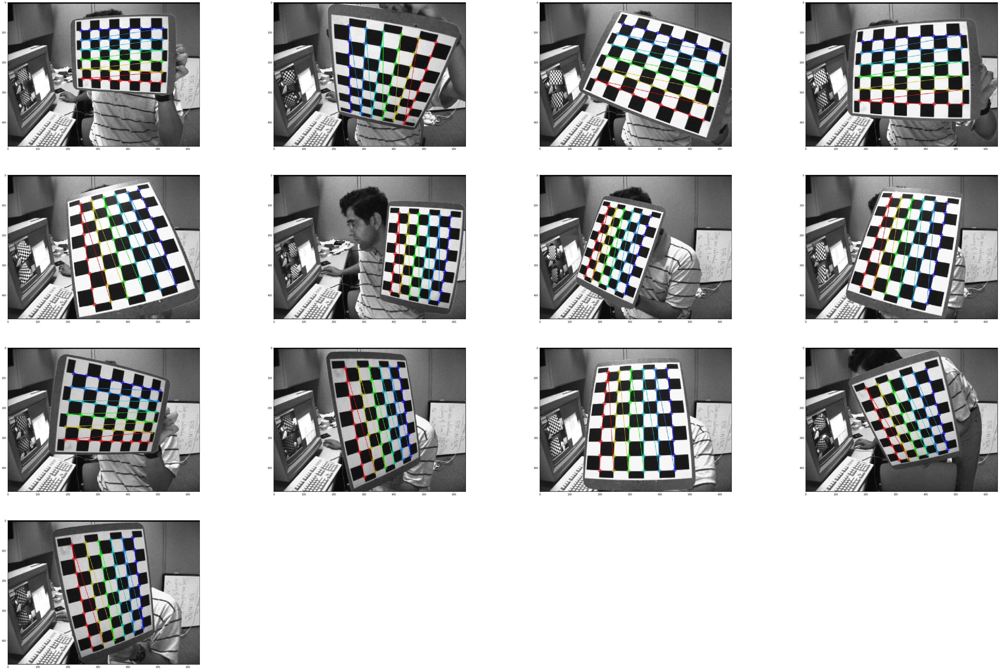

Calibration total error: 0.0409572853898306


In [18]:
cv_undistorted_imgs = CameraCalibration.run((9, 6), chassboard, rows=4)

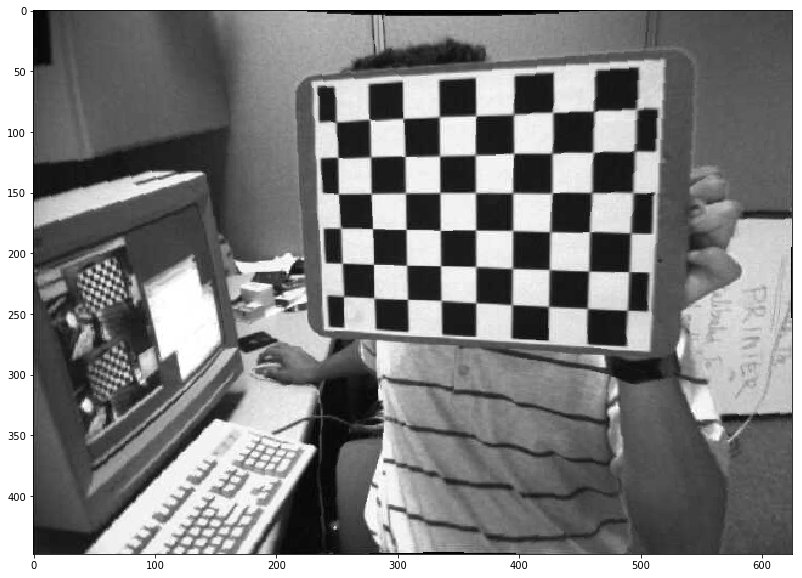

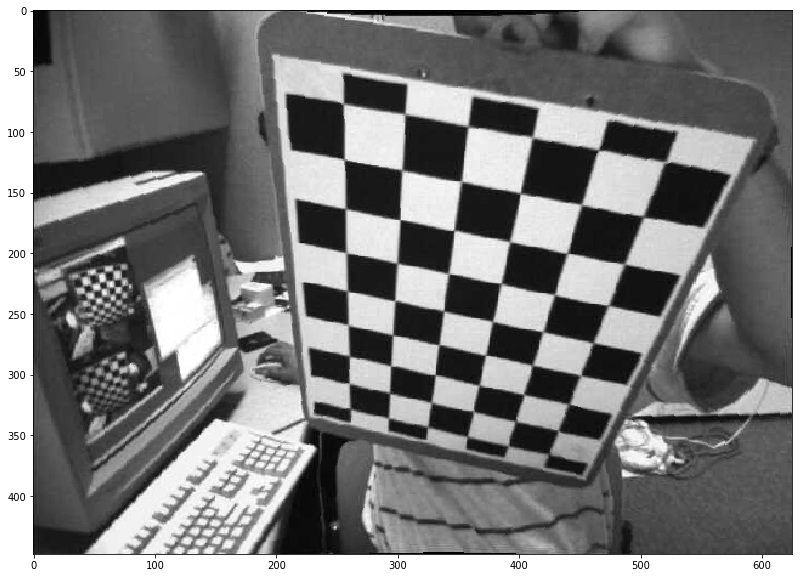

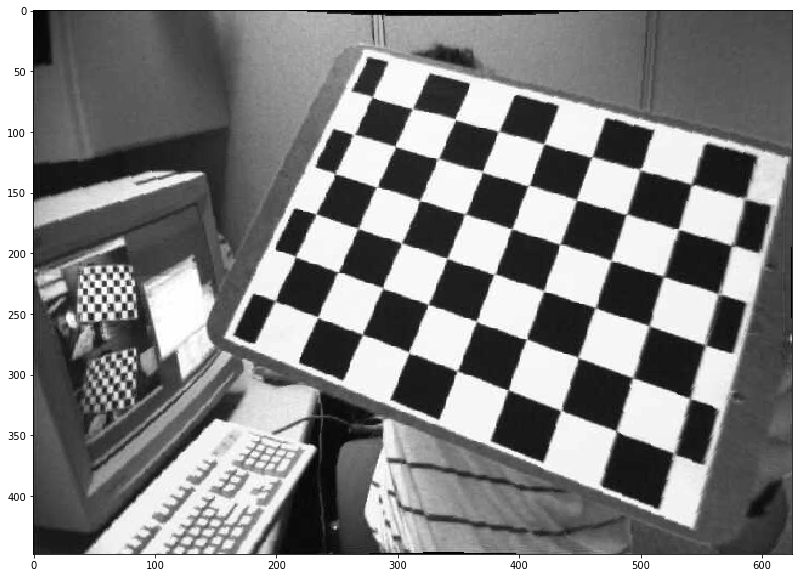

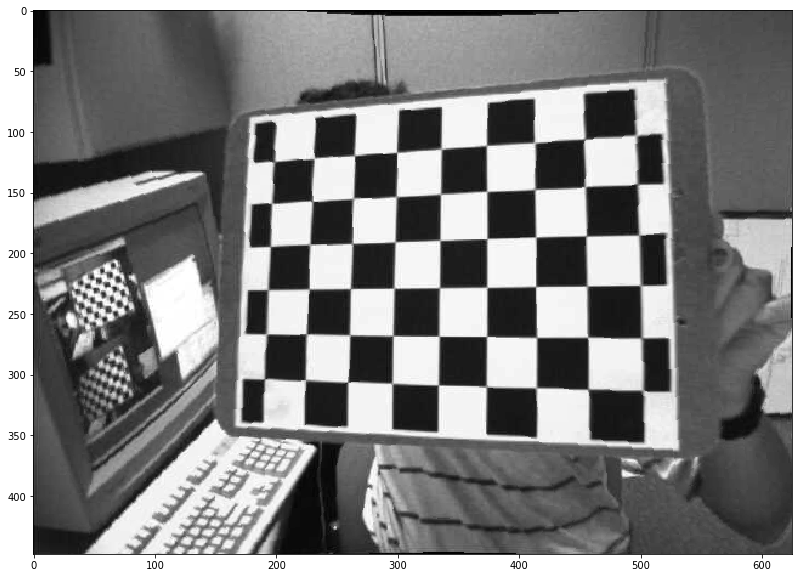

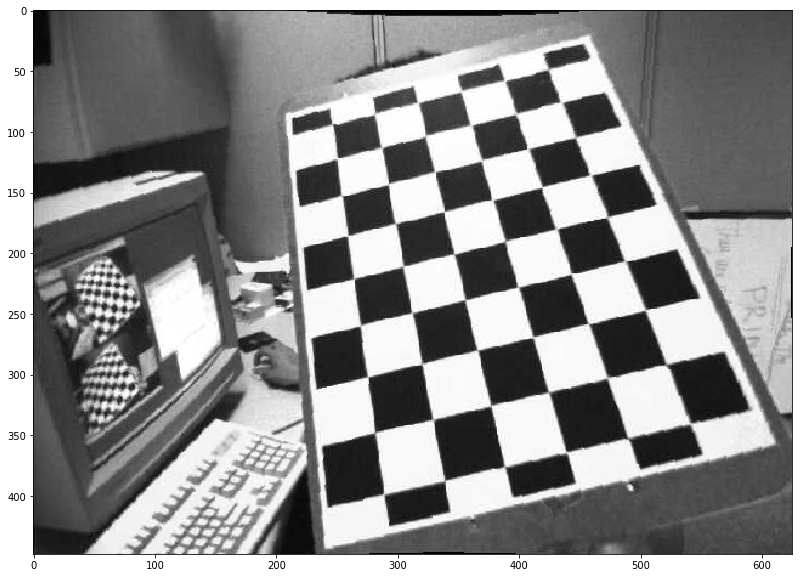

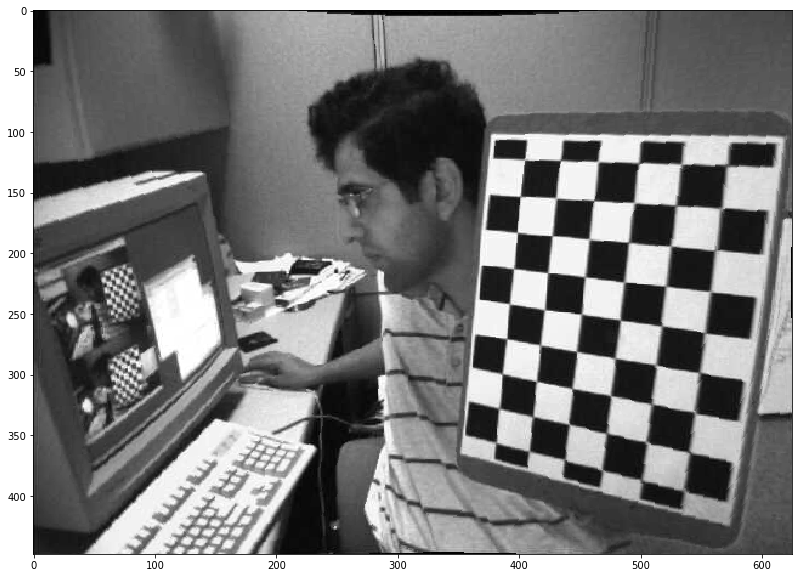

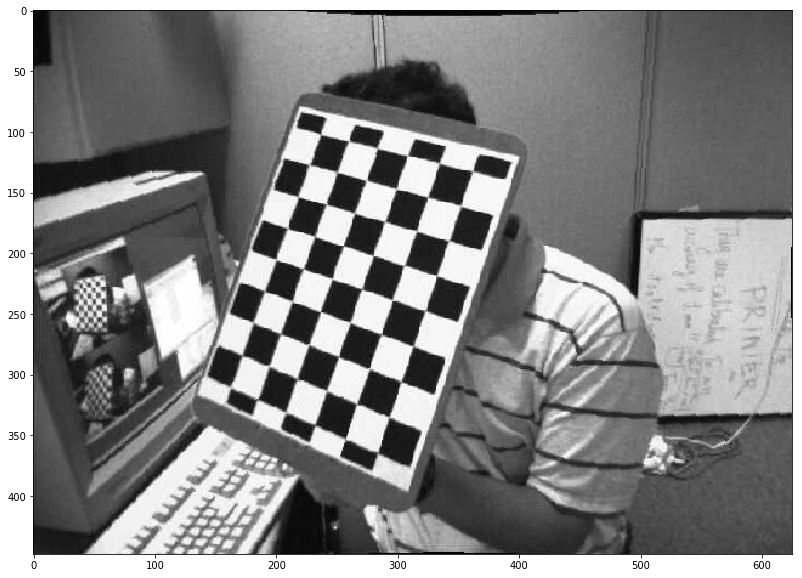

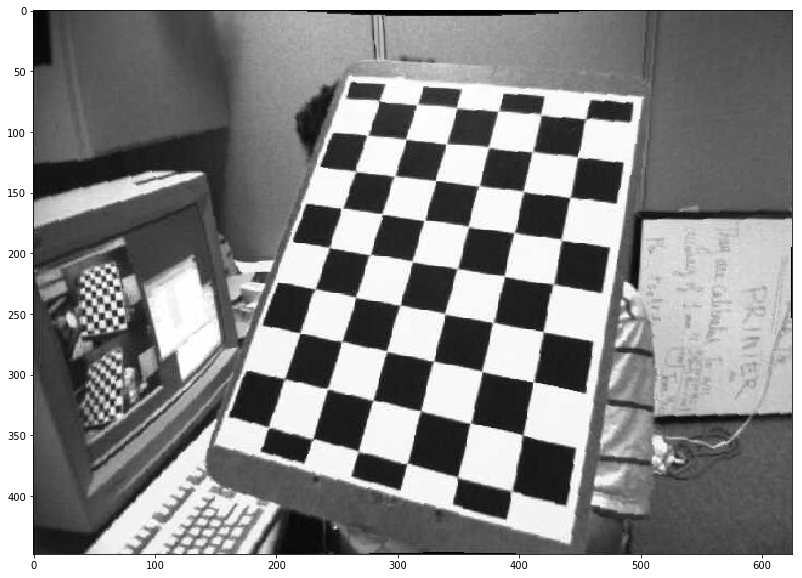

In [ ]:
_ = [img_show(img, figsize=(20, 10)) for img in cv_undistorted_imgs]